# 👨🏻‍💻 Assessment of data quality and availability
<br>
<img style="float: left; padding-right: 15px; padding-left: 0px;" src="../sources/images/logo_continuum.png" width="260px" align=”left” >

This jupyter notebook provide an interactive framework for helping to analyse the time series collected in the IWRM project in the 3 pilot basins. Comments guides the users in the parameters that can be modified.
    
**Flow of the exercise**
1. **Map**: show stations with names on top of basins (+ lakes).  
2. **Data consistency**: quick coverage plot to help you pick **START_YEAR** and **END_YEAR**.  
3. **Availability map**: % of available days per station in the chosen period.  
4. **Value maps**: map **max / min / mean / sum** per station over the chosen period.  
5. **Plots**: single-station and multi-station comparisons.

## 0) Setup & paths
Initial setting of the exercise, allow to choose the focus of the analysis

In [12]:

# You can modify:
# - BASE: base folder of the unpacked MOWE data (already set)
# - BASIN: choose one from detected basins (see printout)
# - MISSING_CODES: values to treat as missing in time series (e.g. -9999)

from pathlib import Path
import pandas as pd
import numpy as np
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors


BASE = Path(r"../sources/datasets/")
GIS_DIR = BASE / "mowe" / "GIS"
STATIONS_DIR = GIS_DIR / "stations"
SHAPE_DIR = GIS_DIR / "shapefile"
SERIES_DIR = BASE / "mowe" / "series" / "river_flow"
RIVER_DIR = BASE / "meritHYDRO"

# Optional: treat these numeric values as missing in the series
MISSING_CODES = [-9999, -90]  # e.g. [-9999, -99]

# Detect available basins from station shapefile names
basin_files = sorted([p for p in STATIONS_DIR.glob("*_river_flow.shp")])
BASINS = [p.stem.replace("_river_flow","") for p in basin_files]
print("Detected basins:", BASINS)

# Choose a basin (default: first one)
BASIN = "shebele" #BASINS[0] if BASINS else None
print("Selected BASIN:", BASIN)

# Files for polygons/basemap
BASINS_MASK = SHAPE_DIR / "basins_iwrm.shp"
LAKES_FILE = SHAPE_DIR / "lakes_mowe.shp"

assert BASINS_MASK.exists(), "Missing basins_iwrm.shp in GIS/shapefile"
print("Data root:", BASE.resolve())

Detected basins: ['awash', 'danakil', 'shebele']
Selected BASIN: shebele
Data root: /home/continuumuser/workdir/sources/datasets


## 1) Load GIS data (stations + basins)
Load all the data, normalise some name in the files and simplify the river network

In [13]:

# You can modify:
# - Nothing critical here; it reads the selected basin stations and base layers.

# Station shapefile for the chosen basin
st_path = STATIONS_DIR / f"{BASIN}_river_flow.shp"
stations = gpd.read_file(st_path)
stations = stations.rename(columns=lambda c: c.strip().replace(" ", "_"))
# Ensure CRS is WGS84
if stations.crs is None or stations.crs.to_epsg() != 4326:
    stations = stations.to_crs(4326)

# Drop rows with missing geometry
missing_geom = stations.geometry.isna().sum()
if missing_geom > 0:
    print(f"[WARN] Dropping {missing_geom} station(s) with no geometry.")
    stations = stations[stations.geometry.notna()].copy()
    
# Polygons/lakes (optional but nice basemap)
basins_poly = gpd.read_file(BASINS_MASK)
if basins_poly.crs is None or basins_poly.crs.to_epsg() != 4326:
    basins_poly = basins_poly.to_crs(4326)

lakes = None
if LAKES_FILE.exists():
    lakes = gpd.read_file(LAKES_FILE)
    if lakes.crs is None or lakes.crs.to_epsg() != 4326:
        lakes = lakes.to_crs(4326)
        
        
# --- River network file ---
RIVER_FILE = RIVER_DIR /"meritHYDRO_river_ETH.shp"

rivers_net = None
if RIVER_FILE.exists():
    rivers_net = gpd.read_file(RIVER_FILE)
    if rivers_net.crs is None or rivers_net.crs.to_epsg() != 4326:
        rivers_net = rivers_net.to_crs(4326)
    print("Loaded river network:", RIVER_FILE)
else:
    print("River network file not found:", RIVER_FILE)

print("Stations:", stations.shape, "| Basins polygons:", basins_poly.shape, "| Lakes:", (lakes.shape if lakes is not None else None))
display(stations)


[WARN] Dropping 1 station(s) with no geometry.
Loaded river network: ../sources/datasets/meritHYDRO/meritHYDRO_river_ETH.shp
Stations: (11, 7) | Basins polygons: (3, 2) | Lakes: (88, 13)


,Name,Source,N,E,Lat,Lon,geometry
0,Asasa Nr Asasa,Efrem,"7°6'27.04""N","39°11'56.70""E",7.10751,39.19908,POINT (39.19707 7.10977)
1,Dawe Nr Garamuleta,Efrem,"9°17'24.85""N","41°52'41.32""E",9.29024,41.87814,POINT (41.87809 9.29037)
2,Erer Guda,Efrem,"9°14'31.58""N","42°14'52.42""E",9.24211,42.24789,POINT (42.24789 9.24211)
3,Fruna Adaba,Efrem,"7° 0'59.11""N","39°25'16.46""E",7.01642,39.42124,POINT (39.42124 7.01642)
4,Herero,File data,"7°0'0""N","39°19'0""E",7.00000,39.31667,POINT (39.31978 6.99628)
5,Hirna,Efrem,"9°10'11.65""N","41°6'43.91""E",9.16990,41.11220,POINT (41.09991 9.21598)
6,Koluu Badessa,Efrem,"8°53'51.41""N","40°46'47.09""E",8.89761,40.77975,POINT (40.77975 8.89761)
7,Leliso Adaba,Efrem,"7°0'19.16""N","39°22'48.44""E",7.00532,39.38012,POINT (39.38012 7.00532)
8,MAribo Adaba,Efrem,"7°0'4.63""N","39°20'15.31""E",7.00129,39.33759,POINT (39.33692 7.00174)
9,Wabi Below Bridge,Efrem,"7°1'4.22""N","39°2'12.25""E",7.01784,39.03674,POINT (39.03153 7.01427)


In [14]:
if BASIN == "shebele":
    BASIN_NAME = "Shebelle"
else:
    BASIN_NAME = BASIN
    
rivers_net_sel = None
if "rivers_net" in globals() and rivers_net is not None:
    # Get the selected basin polygon (dissolved in case there are multi‑parts)
    sel_poly = basins_poly.loc[basins_poly["BASIN_NAME"] == BASIN_NAME.capitalize(), "geometry"]
    if not sel_poly.empty:
        basin_geom = sel_poly.unary_union

        # 1) Fast bbox pre‑filter (uses spatial index under the hood)
        cand = rivers_net.loc[rivers_net.intersects(basin_geom.bounds_to_polygon() if hasattr(basin_geom, "bounds_to_polygon") else basin_geom.envelope)].copy()

        # 2) Precise intersection clip
        try:
            basin_gdf = gpd.GeoDataFrame(geometry=[basin_geom], crs=basins_poly.crs)
            rivers_net_sel = gpd.overlay(cand, basin_gdf, how="intersection")
        except Exception:
            # Fallback if overlay not available
            rivers_net_sel = cand.loc[cand.intersects(basin_geom)].copy()

        # Optional: simplify to speed up Folium rendering
        SIMPLIFY_TOL=0
        if SIMPLIFY_TOL and SIMPLIFY_TOL > 0:
            rivers_net_sel["geometry"] = rivers_net_sel.geometry.simplify(SIMPLIFY_TOL, preserve_topology=True)

        print(f"Clipped river network: {len(rivers_net_sel)} segments inside '{BASIN}'")
    else:
        print("Selected basin geometry not found for clipping.")
else:
    print("River network (rivers_net) not loaded in Setup.")


/tmp/ipykernel_71/2333899900.py:11: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  basin_geom = sel_poly.unary_union


Clipped river network: 1392 segments inside 'shebele'


## 2) Map — general localization (stations with names)
Plot the locsalization of the stations. By clicking on a point the station name pop up.

In [15]:

# You can modify:
# - BASE_ZOOM for initial view

BASE_ZOOM = 7

# Center map at station median
center = [float(stations.geometry.y.median()), float(stations.geometry.x.median())]
m0 = folium.Map(location=center, zoom_start=BASE_ZOOM, tiles="OpenStreetMap")

# Basins polygons
folium.GeoJson(
    basins_poly.to_json(),
    name="Basins",
    style_function=lambda feat: {"fillOpacity": 0.03, "weight": 1.2}
).add_to(m0)

# Lakes (if available)
if lakes is not None:
    folium.GeoJson(
        lakes.to_json(),
        name="Lakes",
        style_function=lambda feat: {"fillOpacity": 0.1, "weight": 0.8}
    ).add_to(m0)
    
# Rivers (if available)
try:
    layer = rivers_net_sel if rivers_net_sel is not None else rivers_net
    if layer is not None:
        folium.GeoJson(
            layer.to_json(),
            name="River network",
            style_function=lambda feat: {"weight": 1, "opacity": 0.8}
        ).add_to(m0)
except NameError:
    pass

# Stations with names
name_col = "Name" if "Name" in stations.columns else ("name" if "name" in stations.columns else stations.columns[0])
for _, row in stations.iterrows():
    nm = row[name_col]
    folium.Marker(
        location=[float(row.geometry.y), float(row.geometry.x)],
        tooltip=str(nm),
        popup=str(nm),
    ).add_to(m0)

folium.LayerControl().add_to(m0)
m0


## 3) Load time series (selected basin) & standardize names
Load time series and standardize series by removing spaces replacing with "_"

In [16]:
# 1) Helper: replace spaces with underscores, keep caps
def std(s):
    return str(s).replace(" ", "_")

stations = stations.copy()
stations["name_std"] = stations[name_col].apply(std)

# 2) Series keys from CSV file names (stem, no extension)
if f"{BASIN}" == "shebele":
    series_dir = SERIES_DIR / "shebelle"
else:
    series_dir = SERIES_DIR / f"{BASIN}"
series_files = sorted((series_dir).glob("*.csv"))
series_key_to_file = {std(p.stem): p for p in series_files}

station_keys = set(stations["name_std"])
series_keys = set(series_key_to_file.keys())

# 3) Report mismatches
stations_without_series = sorted(station_keys - series_keys)
series_without_station = sorted(series_keys - station_keys)

print(f"Stations with NO series ({len(stations_without_series)}):")
for k in stations_without_series:
    nm = stations.loc[stations["name_std"] == k, name_col].iloc[0]
    print(f" - {nm} (std='{k}')")

print(f"\nSeries files with NO station ({len(series_without_station)}):")
for k in series_without_station:
    print(f" - {series_key_to_file[k].name} (std='{k}')")

# 4) Load matched series only
records = []
for key, file in series_key_to_file.items():
    if key not in station_keys:
        continue
    df = pd.read_csv(file, header=None, names=["date", "value"])
    df["datetime"] = pd.to_datetime(df["date"], format="%d/%m/%Y", errors="coerce")
    df = df.dropna(subset=["datetime"])
    if MISSING_CODES:
        df["value"] = df["value"].replace({c: np.nan for c in MISSING_CODES})
    df["name_std"] = key
    records.append(df[["name_std", "datetime", "value"]])

series = pd.concat(records, ignore_index=True) if records else pd.DataFrame(columns=["name_std", "datetime", "value"])

# 5) Join back readable station Name
series = series.merge(stations[["name_std", name_col]], on="name_std", how="left").rename(columns={name_col: "Name"})

print(f"\nSeries rows (joined): {len(series)}, Stations matched: {series['Name'].nunique()}")
display(series.head())


Stations with NO series (1):
 - Herero (std='Herero')

Series files with NO station (1):
 - Wabi_below_Power_House.csv (std='Wabi_below_Power_House')

Series rows (joined): 95995, Stations matched: 10


,name_std,datetime,value,Name
0,Asasa_Nr_Asasa,1980-01-01,0.521,Asasa Nr Asasa
1,Asasa_Nr_Asasa,1980-01-02,0.521,Asasa Nr Asasa
2,Asasa_Nr_Asasa,1980-01-03,0.521,Asasa Nr Asasa
3,Asasa_Nr_Asasa,1980-01-04,0.521,Asasa Nr Asasa
4,Asasa_Nr_Asasa,1980-01-05,0.521,Asasa Nr Asasa


## 4) Data consistency — coverage to choose START/END years
Generate the data availability plot in term of number of station per year. One can set the number of data to be considered for considering a station "available"

/tmp/ipykernel_71/3337316199.py:16: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  .resample(FREQ).sum()


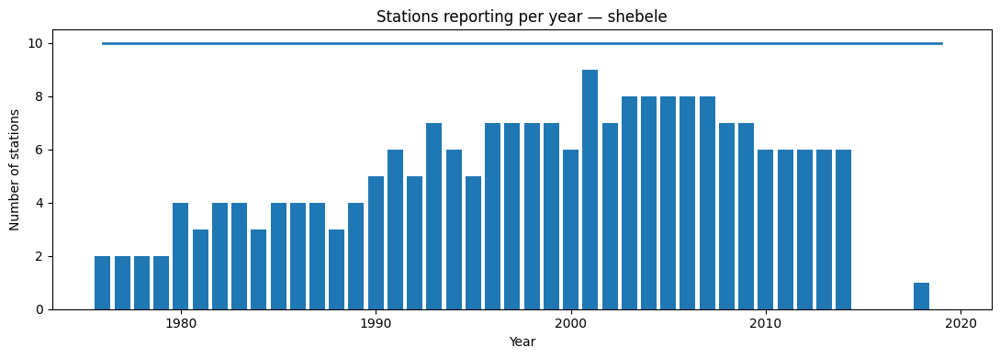

In [17]:
# You can modify:
# - FREQ = "Y" for yearly availability (recommended here)
# - MIN_REPORTS_PER_YEAR = 1  (count a station as available if it reports ≥ this many days in a year)
FREQ = "Y"
MIN_REPORTS_PER_YEAR = 330  # treat a station as "has data" if it has ≥1 non‑NaN value in that year

if series.empty:
    print("No series loaded — check the previous cell.")
else:
    # 1) Build a table of counts per station x year
    s_ok = series.dropna(subset=["value"]).copy()
    s_ok["count"] = 1
    counts = (
        s_ok.set_index("datetime")
            .groupby("Name")["count"]
            .resample(FREQ).sum()
            .reset_index()
    )
    counts["year"] = counts["datetime"].dt.year

    # 2) Pivot: rows = stations, columns = years, values = daily counts
    pvt = counts.pivot(index="Name", columns="year", values="count").fillna(0).astype(int)
    pvt = pvt.reindex(sorted(pvt.index), axis=0)           # sort stations
    pvt = pvt.reindex(sorted(pvt.columns), axis=1)         # sort years

    # 3) Availability matrix (1 if station has ≥ MIN_REPORTS, else 0)
    avail = (pvt >= MIN_REPORTS_PER_YEAR).astype(int)

    # 4) Summary across stations per year
    total_stations = avail.shape[0]
    reporting_per_year = avail.sum(axis=0)                 # number of stations with data each year

    # 5) Plot A: “Stations reporting per year” (bar) + total stations as reference
    years = avail.columns.values
    plt.figure(figsize=(11, 4))
    plt.bar(years, reporting_per_year, width=0.8)
    plt.plot(years, [total_stations]*len(years), linewidth=2)
    plt.title(f"Stations reporting per year — {BASIN}")
    plt.xlabel("Year"); plt.ylabel("Number of stations")
    plt.tight_layout(); plt.show()


Different type of plot and resuming table

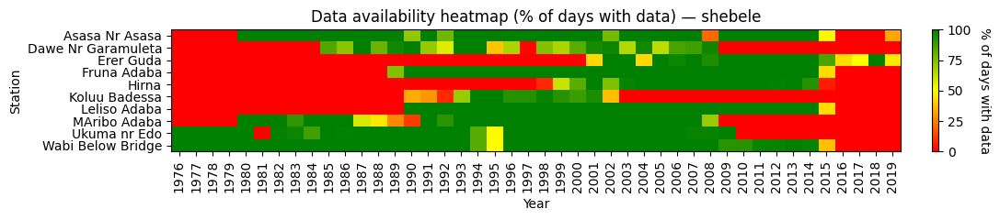

Available years in files: 1976 → 2019


,year,stations_reporting,stations_total
0,1976,2,10
1,1977,2,10
2,1978,2,10
3,1979,2,10
4,1980,4,10
5,1981,3,10
6,1982,4,10
7,1983,4,10
8,1984,3,10
9,1985,4,10


In [18]:
# 6) Plot B: Station × Year % coverage heatmap
plt.figure(figsize=(11, max(2.5, 0.18*total_stations)))

# Calculate % coverage = (# days with data / total days in that year) × 100
days_in_year = pd.Series(index=years, data=[366 if pd.Timestamp(f"{y}-12-31").is_leap_year else 365 for y in years])
coverage_pct = (pvt.div(days_in_year, axis=1) * 100).clip(0, 100)  # pvt has counts of days

# Build a colormap from red (0) → yellow (~50) → green (100)
cmap = mcolors.LinearSegmentedColormap.from_list("red_yellow_green", ["red", "yellow", "green"])

im = plt.imshow(coverage_pct.values, aspect="auto", interpolation="nearest",
                cmap=cmap, vmin=0, vmax=100)

plt.yticks(ticks=np.arange(total_stations), labels=coverage_pct.index)
plt.xticks(ticks=np.arange(len(years)), labels=years, rotation=90)
plt.title(f"Data availability heatmap (% of days with data) — {BASIN}")
plt.xlabel("Year"); plt.ylabel("Station")

# Add colorbar legend
cbar = plt.colorbar(im, fraction=0.03, pad=0.04)
cbar.set_label("% of days with data", rotation=270, labelpad=15)

plt.tight_layout()
plt.show()

# 7) Print a quick range and a compact table for reference
min_year = int(years.min())
max_year = int(years.max())
print(f"Available years in files: {min_year} → {max_year}")
display(pd.DataFrame({
    "year": years,
    "stations_reporting": reporting_per_year,
    "stations_total": total_stations
}).reset_index(drop=True))

## 5) Choose analysis period
Here one can modify the period of the following analysis. TO change again, please re-run the cell after have changed the value

In [8]:

# You can modify:
# - START_YEAR and END_YEAR (inclusive)

START_YEAR = 1998 # int(series["datetime"].dt.year.min()) if not series.empty else 2000
END_YEAR   = 2020 #int(series["datetime"].dt.year.max()) if not series.empty else 2005

mask = (series["datetime"].dt.year >= START_YEAR) & (series["datetime"].dt.year <= END_YEAR)
series_sel = series.loc[mask].copy()

print(f"Selected period: {START_YEAR}–{END_YEAR}")

Selected period: 1998–2020


## 6) Map — data availability per station (%)
Different plots for representing the data availability per station in % over the selected period.

In [9]:
# You can modify:
# - MODE: "color" (fixed size, color shows %), "size" (modify size), or "both"
# - R_FIXED: marker radius when MODE="color" (or base size when "both")

from branca.colormap import LinearColormap

MODE = "color"   # "color" | "size" | "both"
R_FIXED = 8      # used when MODE="color" (or as base for "both")

if series_sel.empty:
    print("No series in selected period.")
else:
    # Expected number of days
    d0 = pd.Timestamp(f"{START_YEAR}-01-01")
    d1 = pd.Timestamp(f"{END_YEAR}-12-31")
    n_days = (d1 - d0).days + 1

    # Count distinct dates with data per station
    days_with = (series_sel.dropna(subset=["value"])
                 .groupby("name_std")["datetime"].nunique()
                 .rename("days_with").reset_index())
    days_with["pct_availability"] = 100.0 * days_with["days_with"] / max(n_days, 1)
    st_join = stations.merge(days_with, on="name_std", how="left")

    # Folium map
    center = [float(stations.geometry.y.median()), float(stations.geometry.x.median())]
    mA = folium.Map(location=center, zoom_start=7, tiles="OpenStreetMap")

    folium.GeoJson(
        basins_poly.to_json(),
        name="Basins",
        style_function=lambda feat: {"fillOpacity": 0.03, "weight": 1.2}
    ).add_to(mA)

    if lakes is not None:
        folium.GeoJson(
            lakes.to_json(),
            name="Lakes",
            style_function=lambda feat: {"fillOpacity": 0.1, "weight": 0.8}
        ).add_to(mA)
    
        # Rivers (if available)
    try:
        layer = rivers_net_sel if rivers_net_sel is not None else rivers_net
        if layer is not None:
            folium.GeoJson(
                layer.to_json(),
                name="River network",
                style_function=lambda feat: {"weight": 1, "opacity": 0.8}
            ).add_to(mA)
    except NameError:
        pass

    # --- Visual encodings ---
    v = st_join["pct_availability"]
    # size scaling (only used if MODE in {"size","both"})
    if MODE in {"size", "both"}:
        if v.notna().any() and (v.max() - v.min()) > 0:
            sizes = R_FIXED + 12 * (v.fillna(0) - v.min()) / (v.max() - v.min())
        else:
            sizes = pd.Series(R_FIXED + 6, index=st_join.index)
    else:
        sizes = pd.Series(R_FIXED, index=st_join.index)

    # color scale (used if MODE in {"color","both"})
    colormap = LinearColormap(["red", "yellow", "green"], vmin=0, vmax=100)
    colormap.caption = "Data availability (%)"

    def color_for(pct):
        if pd.isna(pct):
            return "#9E9E9E"  # gray for missing
        return colormap(pct)

    for idx, row in st_join.iterrows():
        pct = row.get("pct_availability")
        val = "NA" if pd.isna(pct) else f"{pct:.1f}%"
        folium.CircleMarker(
            location=[float(row.geometry.y), float(row.geometry.x)],
            radius=float(sizes.loc[idx]),
            popup=folium.Popup(
                html=f"<b>{row[name_col]}</b><br>Availability: {val}<br>{START_YEAR}–{END_YEAR}",
                max_width=250
            ),
            color="#333333",       # thin outline for contrast
            weight=0.5,
            fill=True,
            fill_color=color_for(pct) if MODE in {"color","both"} else None,
            fill_opacity=0.9
        ).add_to(mA)

    # Add legend only when color is used
    if MODE in {"color", "both"}:
        colormap.add_to(mA)

    folium.LayerControl().add_to(mA)
    display(mA)


## 7) Map — value aggregate per station (max/min/mean/sum)
Different type of aggregation at the station level over the selected period for analysing the upstream-downstream consistency, etc.

In [14]:
# You can modify:
# - AGG_FUNC: one of ["max","min","mean","sum"]
# - MODE: "color" (fixed size, color by value), "size" (radius by value), or "both"
# - R_FIXED: marker radius when MODE="color" (or base size for "both")

from branca.colormap import LinearColormap

AGG_FUNC = "mean"          # "max" | "min" | "mean" | "sum"
MODE = "color"            # "color" | "size" | "both"
R_FIXED = 8

if series_sel.empty:
    print("No series in selected period.")
else:
    agg = (series_sel.groupby("name_std")["value"]
           .agg(AGG_FUNC)
           .rename("agg_value")
           .reset_index())
    st_val = stations.merge(agg, on="name_std", how="left")

    center = [float(stations.geometry.y.median()), float(stations.geometry.x.median())]
    mB = folium.Map(location=center, zoom_start=7, tiles="OpenStreetMap")

    folium.GeoJson(
        basins_poly.to_json(),
        name="Basins",
        style_function=lambda feat: {"fillOpacity": 0.03, "weight": 1.2}
    ).add_to(mB)

    if lakes is not None:
        folium.GeoJson(
            lakes.to_json(),
            name="Lakes",
            style_function=lambda feat: {"fillOpacity": 0.1, "weight": 0.8}
        ).add_to(mB)
        
    # Rivers (if available)
    try:
        layer = rivers_net_sel if rivers_net_sel is not None else rivers_net
        if layer is not None:
            folium.GeoJson(
                layer.to_json(),
                name="River network",
                style_function=lambda feat: {"weight": 1, "opacity": 0.8}
            ).add_to(mB)
    except NameError:
        pass

    # Values for styling
    v = st_val["agg_value"]

    # Size scaling (only used for MODE in {"size","both"})
    if MODE in {"size", "both"}:
        if v.notna().any() and (v.max() - v.min()) > 0:
            sizes = R_FIXED + 12 * (v.fillna(v.min()) - v.min()) / (v.max() - v.min())
        else:
            sizes = pd.Series(R_FIXED + 6, index=st_val.index)
    else:
        sizes = pd.Series(R_FIXED, index=st_val.index)

    # Color scale (used for MODE in {"color","both"})
    # Lower values -> red, mid -> yellow, higher -> green
    if v.notna().any():
        vmin = float(v.min())
        vmax = float(v.max())
        if vmin == vmax:
            vmin = vmin - 1e-9  # avoid zero-range
        colormap = LinearColormap(["red", "yellow", "green"], vmin=vmin, vmax=vmax)
    else:
        colormap = LinearColormap(["#cccccc", "#cccccc"], vmin=0, vmax=1)  # neutral
    colormap.caption = f"{AGG_FUNC.upper()} value"

    def color_for(val):
        if pd.isna(val):
            return "#9E9E9E"  # gray for missing
        return colormap(val)

    for idx, row in st_val.iterrows():
        val = row.get("agg_value")
        val_str = "NA" if pd.isna(val) else f"{val:.3f}"
        folium.CircleMarker(
            location=[float(row.geometry.y), float(row.geometry.x)],
            radius=float(sizes.loc[idx]),
            popup=folium.Popup(
                html=f"<b>{row[name_col]}</b><br>{AGG_FUNC.upper()}: {val_str}<br>{START_YEAR}–{END_YEAR}",
                max_width=260
            ),
            color="#333333",           # subtle outline
            weight=0.5,
            fill=True,
            fill_color=color_for(val) if MODE in {"color","both"} else None,
            fill_opacity=0.9
        ).add_to(mB)

    if MODE in {"color", "both"}:
        colormap.add_to(mB)

    folium.LayerControl().add_to(mB)
    display(mB)



## 8) Plot — single station time series
Provide the list of the available section (refer to the map at the beginning for the location) and allow several plots

In [15]:
np.unique(series_sel["Name"])

array(['Arba Bordade', 'Arba bomsa', 'Ataye', 'Awash 7kilo',
       'Awash Adaitu', 'Awash Bokayitu', 'Awash Dubti', 'Awash Ginchi',
       'Awash Melka sedi', 'Awash below koka', 'Awash hombole',
       'Awash metehara', 'Awash nr Bello', 'Awash nr m kunture',
       'Awash wonji', 'Awsh Melka werer', 'Berga Addisalem',
       'Borkena Borumeda', 'Borkena kombolcha', 'Erer@nd gota',
       'Erere germam', 'Great Akaki', 'Holota Holota', 'Jara Jara',
       'Jemjem olonkomi', 'Jewoha Jewoha', 'Kasem Awara melka',
       'Kasem Beke', 'Keleta Sire', 'Kete Haik', 'Litle Akaki',
       'MIlle Mille', 'Megangna Mersa', 'Meisso', 'Mersa Mersa',
       'Milli Pasomille', 'Mojo at Mojo', 'Mulo Mulo',
       'Muticha dslegadadi', 'Robit Robot', 'wash berga'], dtype=object)

SIngle plot, with different aggregation in time

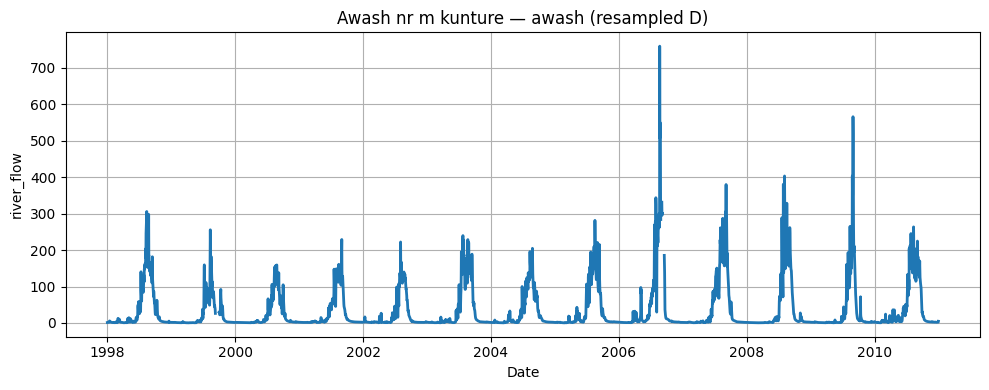

In [16]:
# You can modify:
# - STATION_NAME: pick a station from stations['Name']
# - FREQ: resampling ('D' daily, 'W' weekly, 'M' monthly)

if series_sel.empty:
    print("No series in selected period.")
else:
    # Default: first station with data
    STATION_NAME = 'Awash nr m kunture'

    FREQ = "D"
    sdata = (series_sel[series_sel["Name"]==STATION_NAME]
             .set_index("datetime")["value"]
             .resample(FREQ).mean())         # Here also the aggregating function can be modified!
    plt.figure(figsize=(10,4))
    plt.plot(sdata.index.values, sdata.values, linewidth=2)
    plt.title(f"{STATION_NAME} — {BASIN} (resampled {FREQ})")
    plt.xlabel("Date"); plt.ylabel("river_flow")
    plt.grid(True); plt.tight_layout(); plt.show()


## 9) Plot — compare 2–4 stations

Comparison between sections for upstream/downstream analysis

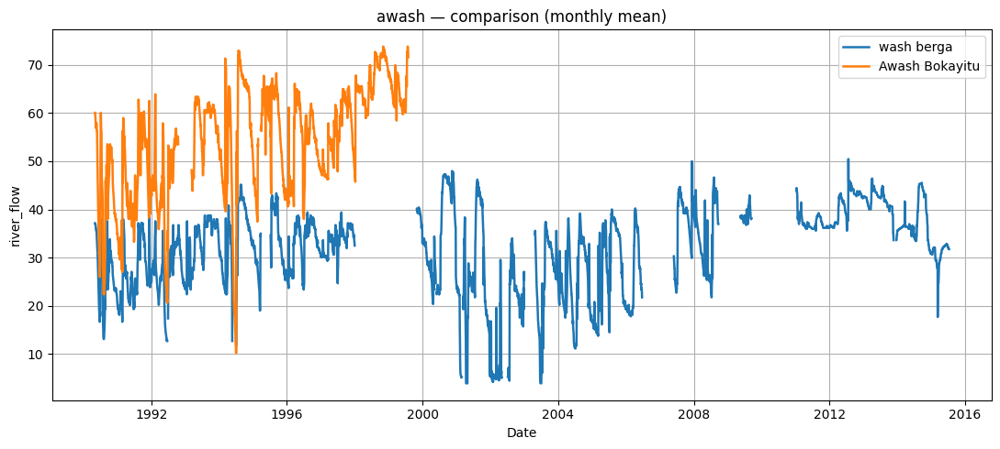

In [32]:
# You can modify:
# - STATIONS_TO_COMPARE: list of station names (strings)
# - NORMALIZE=True to compare shapes only

if series_sel.empty:
    print("No series in selected period.")
else:
    unique_names = list(series_sel["Name"].unique())
    STATIONS_TO_COMPARE = ['wash berga', 'Awash Bokayitu']
    NORMALIZE = False

    plt.figure(figsize=(11,5))
    for nm in STATIONS_TO_COMPARE:
        sdata = (series_sel[series_sel["Name"]==nm]
                 .set_index("datetime")["value"]
                 .resample("D").mean())
        y = sdata.values
        if NORMALIZE and np.nanmax(y) > np.nanmin(y):
            y = (y - np.nanmin(y)) / (np.nanmax(y) - np.nanmin(y))
        plt.plot(sdata.index.values, y, linewidth=1.8, label=nm)
    ttl = f"{BASIN} — comparison (monthly mean)"
    plt.title(ttl); plt.xlabel("Date"); plt.ylabel("river_flow" + (" (normalized)" if NORMALIZE else ""))
    plt.legend(); plt.grid(True); plt.tight_layout(); plt.show()
